<a href="https://colab.research.google.com/github/RiteshDKgpian/X-tra-Telegram/blob/master/Ritesh_Dwivedi_(Difference_Between_Two_Images).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python #Installing 'opencv-python' package using pip for the OpenCV library.

In [ ]:
#Importing necessary libraries for computer vision tasks.
import cv2
import imutils
import numpy as np
from google.colab.patches import cv2_imshow

# Define the number of examples

In [ ]:
num_examples = 10 # Number of examples

# Function to process image pair

In [ ]:
def process_image_pair(i):
    img1_path = f'/content/Example{i}_input1.png'    #Path of the image
    img2_path = f'/content/Example{i}_input2.png'

    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    #Converting images to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(gray1, gray2)     # Calculating the absolute difference between grayscale images

    # Applying Threshold & Dilation
    _, thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Finding contours
    contours = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)

    # Function to merge adjacent bounding boxes if they are very close this will make it look clean and clear
    def merge_adjacent_boxes(contours):
        merged_boxes = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            merged = False
            for idx, (merged_x, merged_y, merged_w, merged_h) in enumerate(merged_boxes):
                if (x-5 <= merged_x+merged_w <= x+w + 5) and (y-5 <= merged_y+merged_h <= y+h + 5):
                    merged_boxes[idx] = (min(x, merged_x), min(y, merged_y), max(x + w, merged_x + merged_w) - min(x, merged_x), max(y + h, merged_y + merged_h) - min(y, merged_y))
                    merged = True
                    break
            if not merged:
                merged_boxes.append((x, y, w, h))
        return merged_boxes

    merged_boxes = merge_adjacent_boxes(contours)  #Merging adjacent bounding boxes

    # Drawing merged bounding boxes on the second image
    result_img = img2.copy()
    for merged_box in merged_boxes:
        x, y, w, h = merged_box
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 0, 0), 2)

    cv2_imshow(result_img)  # This will display the result

## It will show the outputs

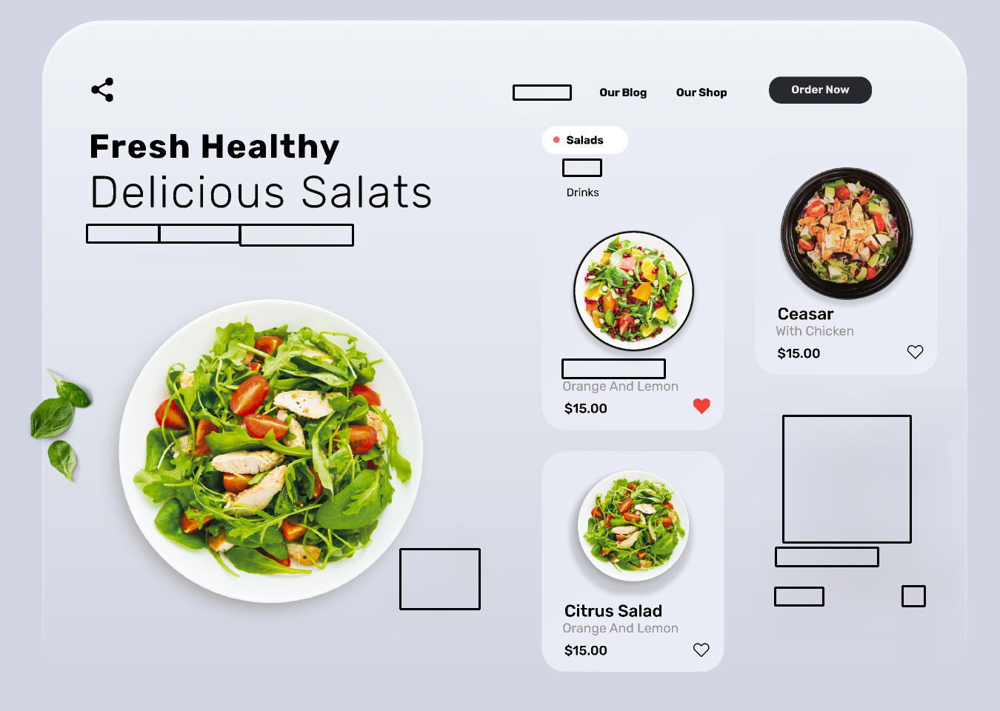

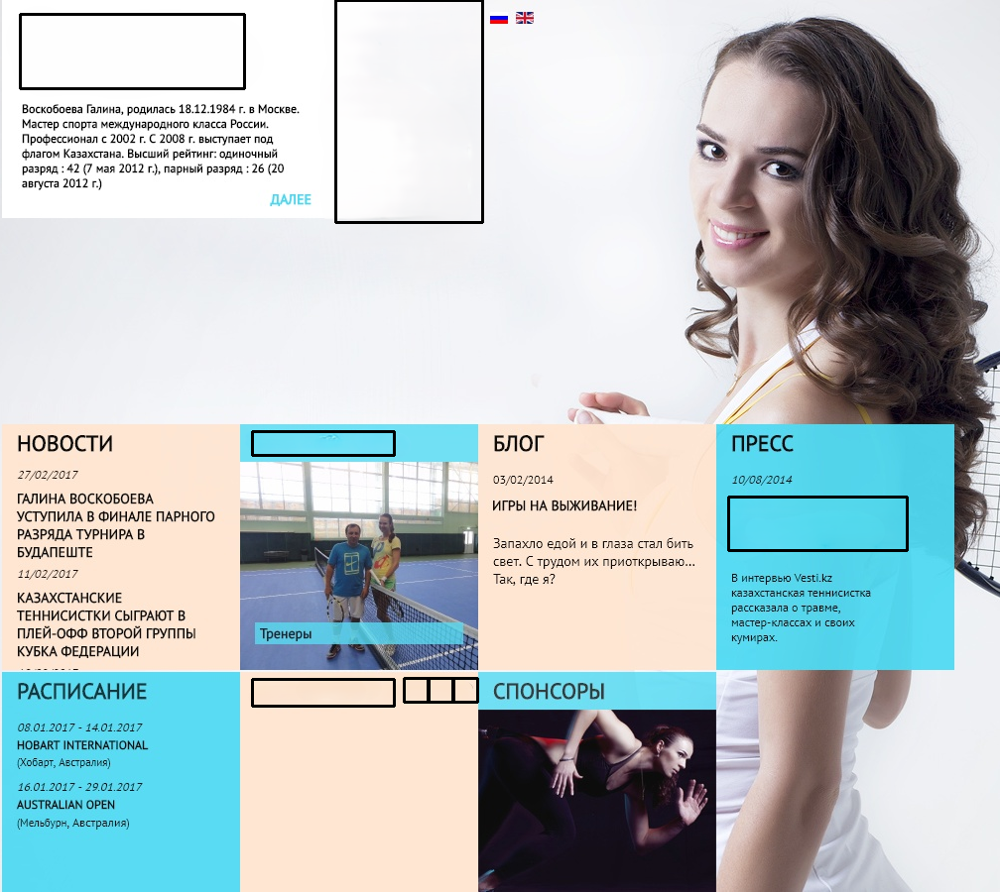

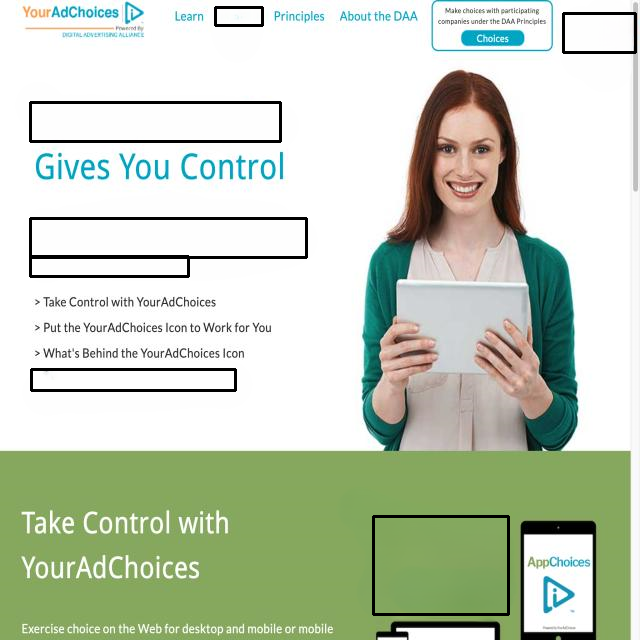

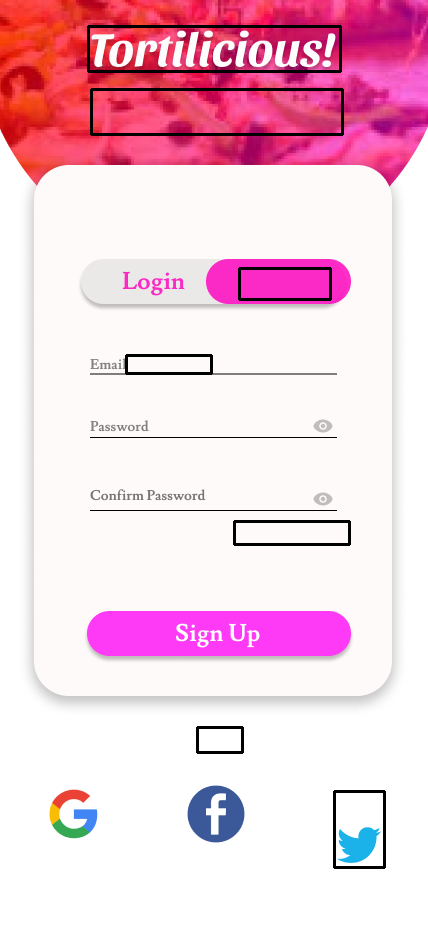

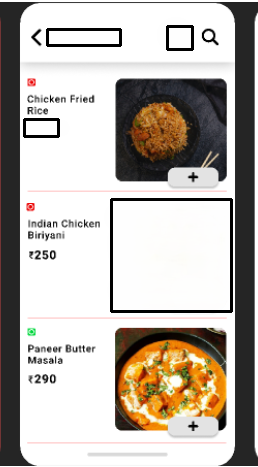

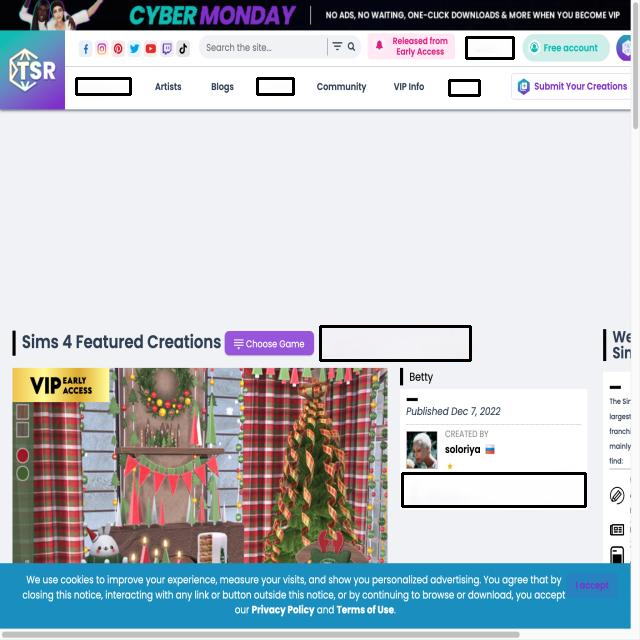

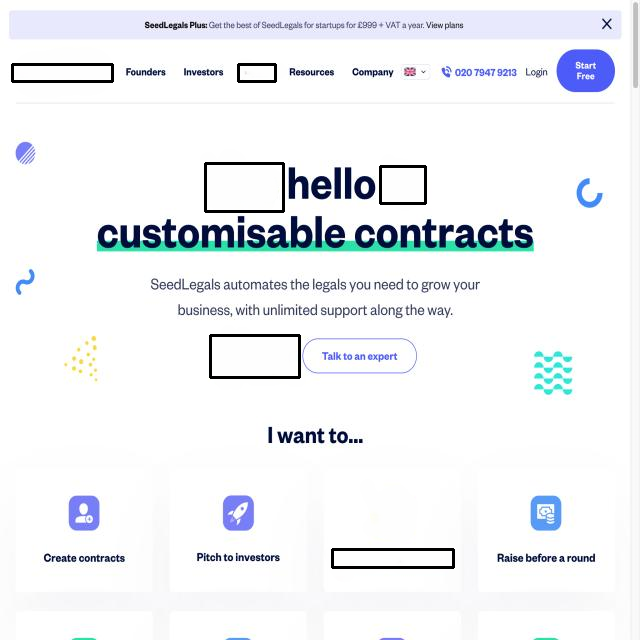

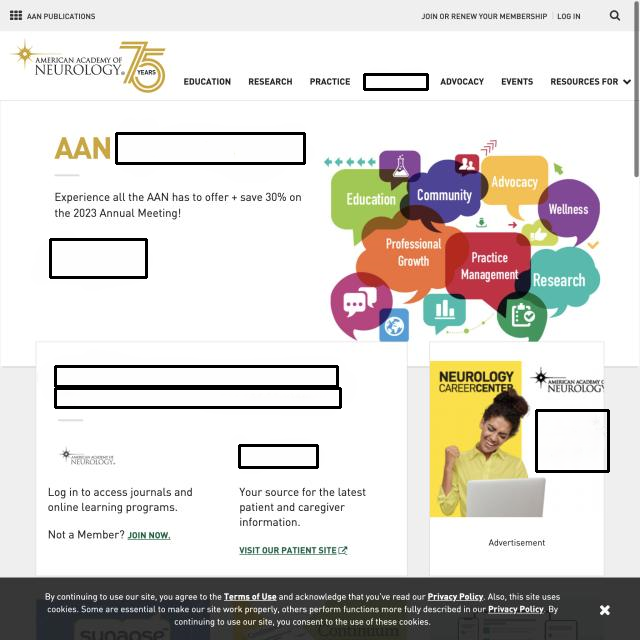

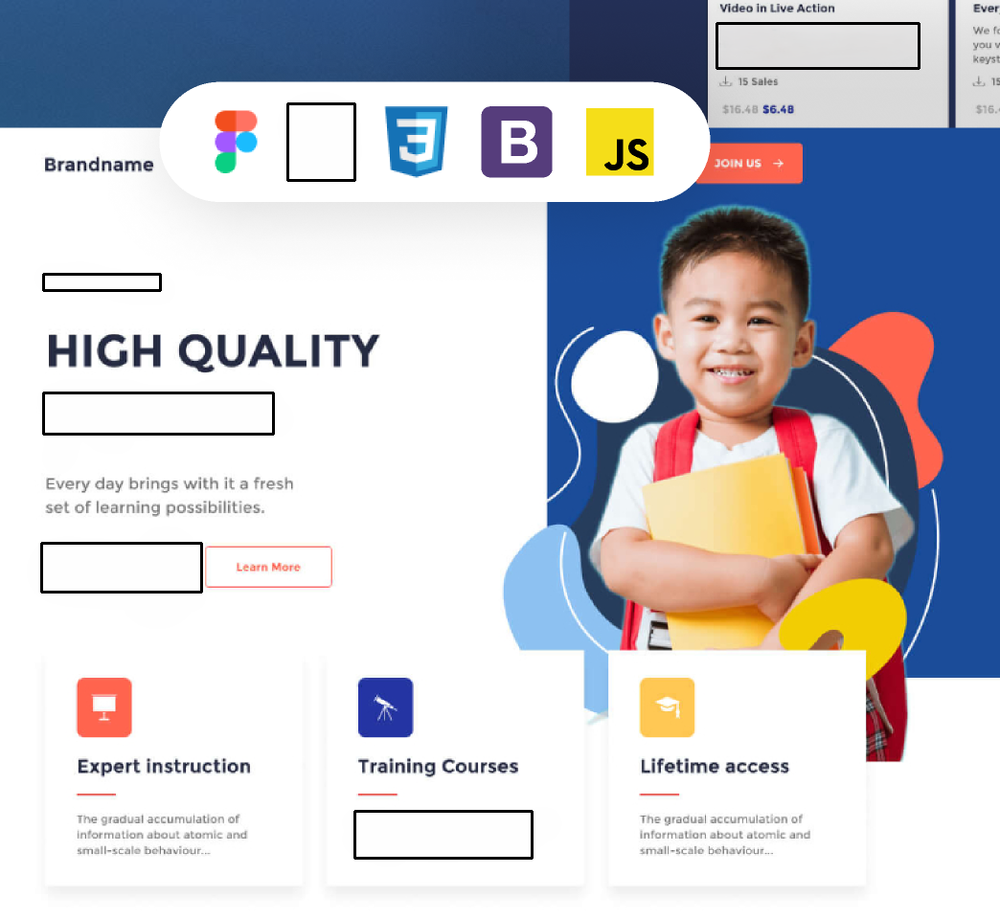

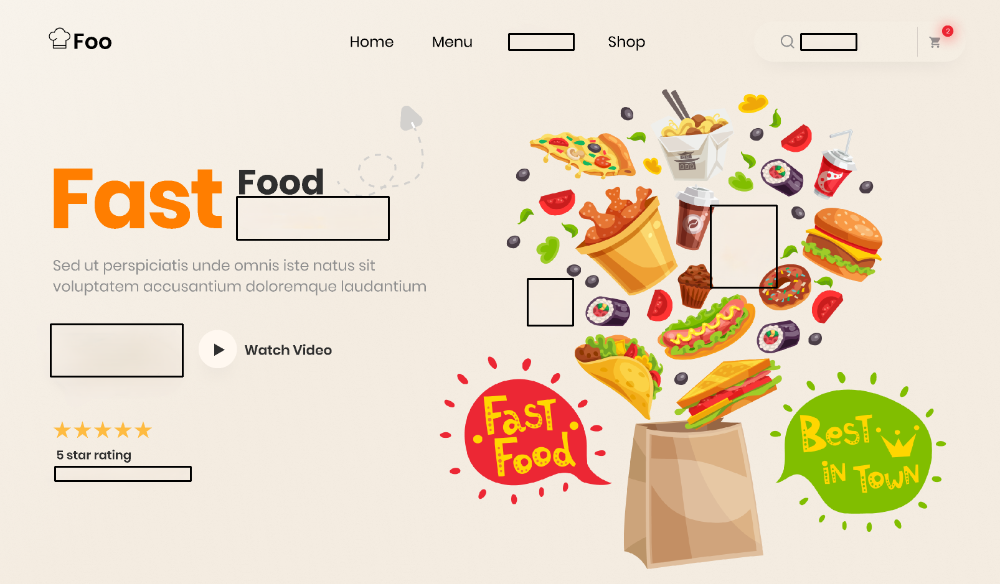

In [ ]:
for i in range(1, num_examples + 1):  # Iterating over all the examples to get the outputs
    process_image_pair(i)
    print(" "*30)

##Code to show all the input(pair) and output images together

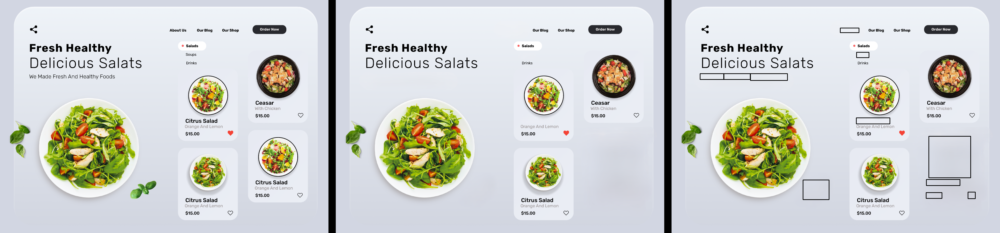

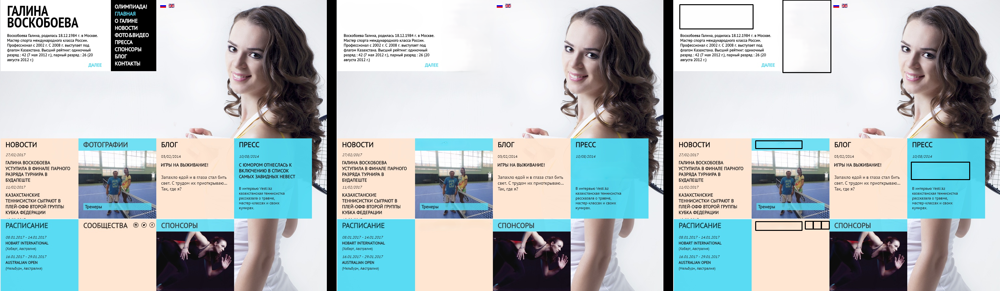

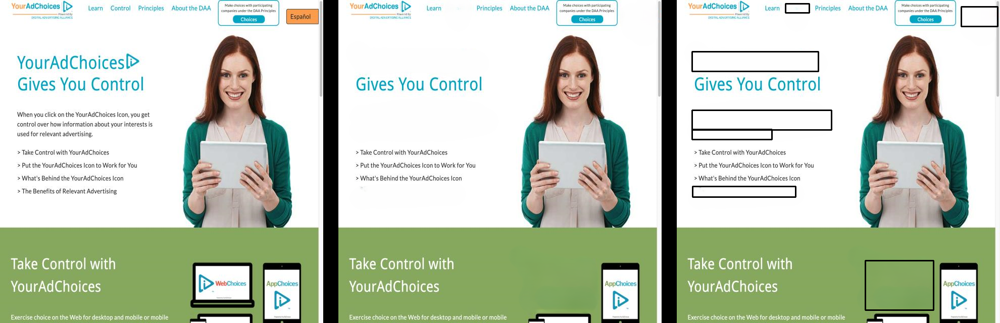

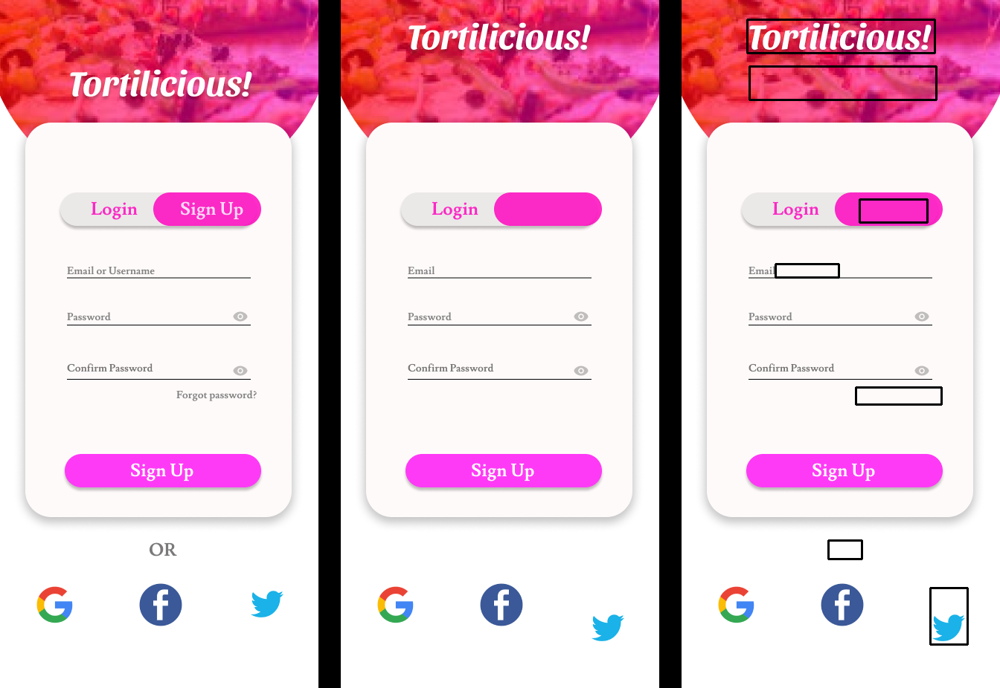

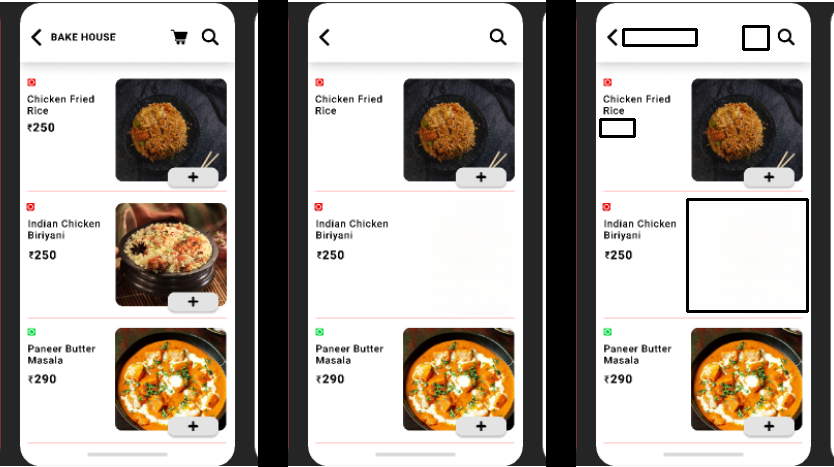

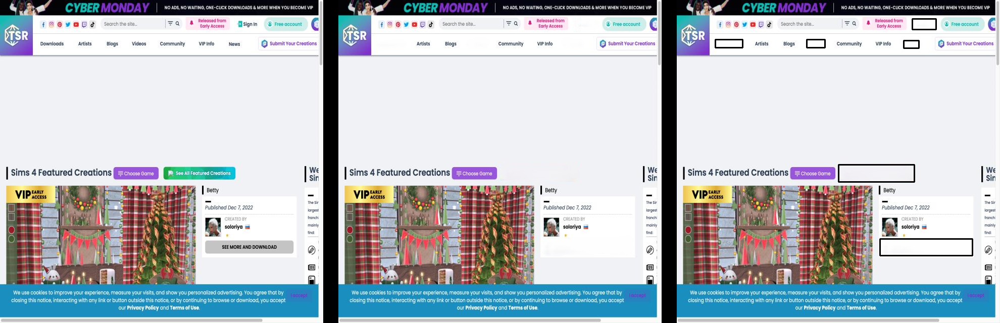

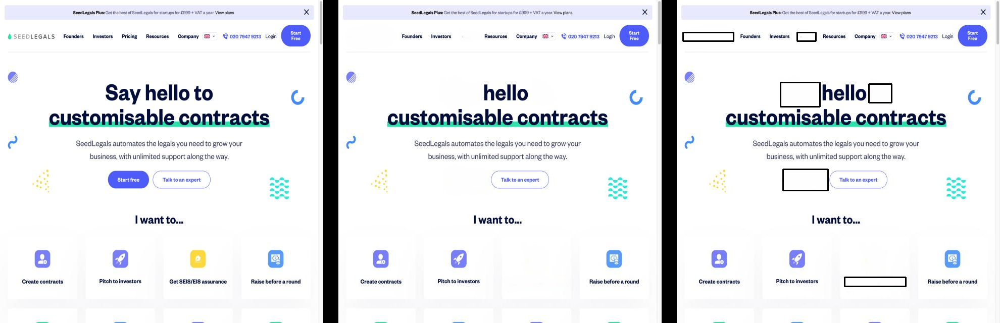

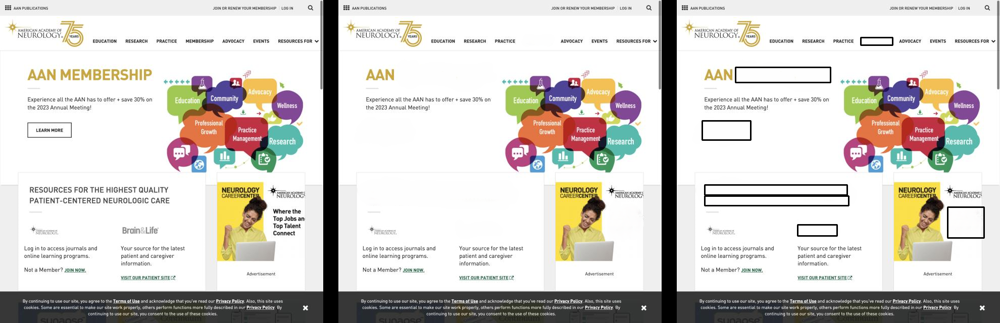

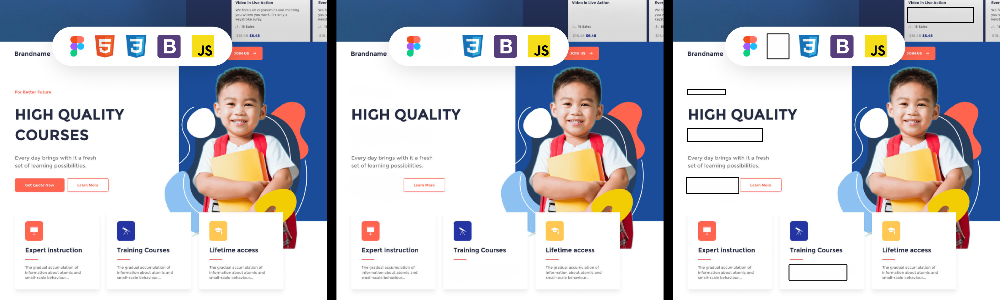

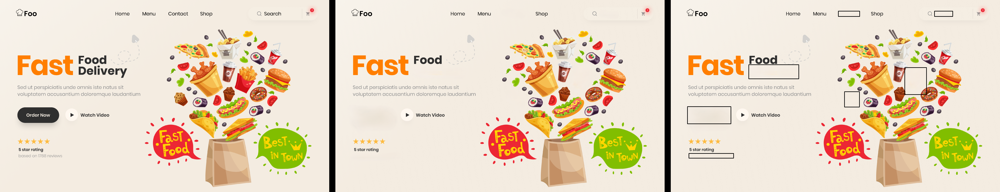

In [ ]:
def process_image_pair(i):
    img1_path = f'/content/Example{i}_input1.png'
    img2_path = f'/content/Example{i}_input2.png'            #No need for comments in this function since it closely resembles the previous function where comments are already provided

    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(gray1, gray2)

    _, thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    contours = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)

    def merge_adjacent_boxes(contours):
        merged_boxes = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            merged = False
            for idx, (merged_x, merged_y, merged_w, merged_h) in enumerate(merged_boxes):
                if (x-5 <= merged_x+merged_w <= x+w + 5) and (y-5 <= merged_y+merged_h <= y+h + 5):
                    merged_boxes[idx] = (min(x, merged_x), min(y, merged_y), max(x + w, merged_x + merged_w) - min(x, merged_x), max(y + h, merged_y + merged_h) - min(y, merged_y))
                    merged = True
                    break
            if not merged:
                merged_boxes.append((x, y, w, h))
        return merged_boxes

    merged_boxes = merge_adjacent_boxes(contours)

    result_img = img2.copy()
    for merged_box in merged_boxes:
        x, y, w, h = merged_box
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 0, 0), 2)

    # Creating blank image for spacing
    spacing = np.zeros((img1.shape[0], 30, 3), dtype=np.uint8)

    # Concatenate images with spacing
    combined_img = np.hstack((img1, spacing, img2, spacing, result_img))

    cv2_imshow(combined_img) #Displaying the result

for i in range(1, num_examples + 1): # Iterating over all examples
    process_image_pair(i)
    print(" " * 30)


## Code to calculate and print Similarity Score

In [ ]:
from skimage.metrics import structural_similarity as ssim

def calculate_similarity(i):

    # Loading images
    img1_path = f'/content/Example{i}_input1.png'
    img2_path = f'/content/Example{i}_input2.png'

    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)    #Converting images to grayscale
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    #Checking if images loaded correctly
    if img1 is None or img2 is None:
        raise ValueError("One or both images failed to load.")

    similarity_score, _ = ssim(gray1, gray2, full=True)   #Calculating Structural Similarity Index (SSI)

    return similarity_score

In [ ]:
for i in range(1, num_examples + 1):
    similarity_score = calculate_similarity(i)
    print(f"Similarity Score of {i}: {similarity_score}")

Similarity Score of 1: 0.9639621762041423
Similarity Score of 2: 0.933267709885295
Similarity Score of 3: 0.9209650596348005
Similarity Score of 4: 0.9388101913918601
Similarity Score of 5: 0.8794943328032699
Similarity Score of 6: 0.9736487223844762
Similarity Score of 7: 0.9728957955364925
Similarity Score of 8: 0.9429967815436454
Similarity Score of 9: 0.9689302477051375
Similarity Score of 10: 0.9711617429298273


##Code to calculate Mean Squared Error

In [ ]:
from skimage.metrics import mean_squared_error

def calculate_mse(i):

    #Loading images
    img1_path = f'/content/Example{i}_input1.png'
    img2_path = f'/content/Example{i}_input2.png'

    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) #Converting images to grayscale
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    if img1 is None or img2 is None:   #Checking if images loaded correctly
        raise ValueError("One or both images failed to load.")

    mse = mean_squared_error(gray1, gray2)   #Calculating Mean Squared Error (MSE)

    return mse

In [ ]:
for i in range(1, num_examples + 1):
    mse = calculate_mse(i)
    print(f"Mean Squared Error of {i}: {mse}")

Mean Squared Error of 1: 303.4956666666667
Mean Squared Error of 2: 2231.802781084656
Mean Squared Error of 3: 608.288251953125
Mean Squared Error of 4: 474.5462546173876
Mean Squared Error of 5: 2916.7059492389158
Mean Squared Error of 6: 200.5559814453125
Mean Squared Error of 7: 414.45566650390623
Mean Squared Error of 8: 331.47406494140625
Mean Squared Error of 9: 301.58153236749683
Mean Squared Error of 10: 567.2553079041985
